In [164]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [165]:
import numpy as np
import pandas as pd
import scipy as sp
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
# Standard plotly import
# import plotly.plotly as tls


from plotly.offline import iplot, init_notebook_mode




# using plotly + cufflinks in offlien mode
init_notebook_mode(connected = True)


from sklearn import preprocessing
from sklearn.metrics  import confusion_matrix, roc_auc_score
from sklearn.model_selection import StratifiedKFold, cross_val_score, KFold
from xgboost import XGBClassifier

import  xgboost as xgb
import lightgbm as lgb
import catboost


import matplotlib.gridspec as gridspec
%matplotlib inline
# import plotly.plotly as py
import plotly.graph_objs as go
import plotly.tools as tls
from  plotly.offline import iplot, init_notebook_mode
import cufflinks
import cufflinks as cf
import plotly.figure_factory as ff


init_notebook_mode(connected= True)

cufflinks.go_offline(connected = True)

import warnings
warnings.filterwarnings("ignore")

import gc
gc.enable()
import logging
logger = logging.getLogger()
logger.setLevel(logging.DEBUG)
import os
print(os.listdir("../input"))
print ( "Ready!")

['ieee-fraud-detection']
Ready!


In [166]:
def resumetable(df):
    print(f"Dataset shape: {df.shape}")
    summary = pd.Dataframe(df.dtypes,columns=['dtypes'])
    summary = summary.reset_index
    summary['Name'] = sumary ['index']
    summary = summary[["Name","dtypes"]]
    summary['Missing'] = df.isnull().sum().values
    summary['Uniques'] = df.unique().values
    summary["First Value"] = df.loc[0].values
    summary["Second Value"] = df.loc[1].values
    summary["Third Value"] = df.loc[2].values

    for name in summary['Name'].value_counts().index:
        print (name)
        summary.loc[summary['Name']==name, 'Entropy'] = round(stats.entropy(df[name].value_counts(normalize = True),base=2),2)
        return summary

def plot_distribution(df,var_select= None, title=None, bins=1.0):
    tmp_fraud = df[df["isFraud"]==1]
    tmp_no_fraud = df[df["isFraud"]==0]
    corr = df['isFraud'].corr(df[var_select])
    corr =  np.round(corr,3)
    tmp1 = tmp_fraud[var_select].dropna()
    tmp2 = tmp_no_fraud[var_select].dropna()
    hist_data = [tmp1, tmp2]
    group_label = ['Fraud','No Fraud']
    colors = ['seagreen', 'indianred']

    fig = ff.create_distplot(hist_data, group_label,colors = colors, show_hist=True, curve_type='kde', bin_size = bins)
    fig['layout'].update(title = title + ' ' + '(corr target =' + str(corr)+  ')')
    iplot(fig, filename = 'Density plot')


def plot_dist_churn(df, col, binary = None):
    tmp_churn = df[df[binary]==1]
    tmp_no_churn = df[df[binary]==0]
    tmp_attr = round(tmp_churn[col].value_counts().sort_index()/ df[col].value_counts().sort_index(),2)*100
    print(f'Distribution of {col}:')
    trace1 = go.Bar(
        x = tmp_churn[col].value_counts().sort_index().index,
        y = tmp_churn[col].value_counts().sort_index().values,
        name = 'Fraud',opacity = 0.8 ,marker = dict(
            color= 'seagreen',
            line = dict(color='#000000',width=1)
        )
    )
    trace2 = go.Bar(
        x = tmp_no_churn[col].value_counts().sort_index().index,
        y = tmp_no_churn[col].value_counts().sort_index().values,
        name = 'No Fraud', opacity = 0.8,
        maker = dict(
            color =  'indianred',
            line = dict(color = '#000000',width =1)
        )
    )


    trace3 = go.Scatter(
        x = tmp_attr.sort_index().index,
        y = tmp_attr.sort_index().values,
        yaxis = 'y2',
        names = '% Fraud', opacity = 0.6,
        marker=dict(
            color = 'black',
            line = dict(color='#000000'),
            width = 2
        )
    )
    layout = go.Layout(
        title = f'Distribution of {col}',
        xaxis = dict (title = col),
        yaxis = dict (title = 'Count'),
        yaxis2 = dict(
            overlaying = 'y',
            side = 'right',
            zeroline = False,
            showline = False,
            title = 'Percentual Fraud Transactions (%)' 
        )
    )
    fig = go.Figure(data = [trace1, trace2, trace3], layout = layout)
    iplot(fig)

In [167]:
    # print('# File size')
    # for f in os.listdir('../input/ieee-fraud-detection/'):
    #     if 'zip' not in f:
    #         print (f.ljust(30) + str(round(os.path.getsize('../input/ieee-fraud-detection'+ f)/1000000,2))+ 'MB')

In [168]:
%%time
train_transaction = pd.read_csv('../input/ieee-fraud-detection/train_transaction.csv', index_col='TransactionID')
test_transaction = pd.read_csv('../input/ieee-fraud-detection/test_transaction.csv', index_col='TransactionID')
train_identity = pd.read_csv('../input/ieee-fraud-detection/train_identity.csv', index_col='TransactionID')
test_identity = pd.read_csv('../input/ieee-fraud-detection/test_identity.csv', index_col='TransactionID')
print ("Data is loaded!")

Data is loaded!
CPU times: user 12.6 s, sys: 5.35 s, total: 18 s
Wall time: 21.9 s


In [169]:

print('train_transaction shape is {}'.format(train_transaction.shape))
print('test_transaction shape is {}'.format(test_transaction.shape))
print('train_identity shape is {}'.format(train_identity.shape))
print('test_identity shape is {}'.format(test_identity.shape))

train_transaction shape is (590540, 393)
test_transaction shape is (506691, 392)
train_identity shape is (144233, 40)
test_identity shape is (141907, 40)


In [170]:
train_transaction.head()

,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
TransactionID,,,,,,,,,,,,,,,,,,,,,
2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,credit,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [171]:
missing_values_count = train_transaction.isnull().sum()
print (missing_values_count[0:10])
total_cells = np.prod(train_transaction.shape)
total_missing = missing_values_count.sum()
print ("% of missing data = ",(total_missing/total_cells) * 100)

isFraud              0
TransactionDT        0
TransactionAmt       0
ProductCD            0
card1                0
card2             8933
card3             1565
card4             1577
card5             4259
card6             1571
dtype: int64
% of missing data =  41.17794374769424


In [172]:

missing_values_count = train_identity.isnull().sum()
print (missing_values_count[0:10])
total_cells = np.prod(train_identity.shape)
total_missing = missing_values_count.sum()
print ("% of missing data = ",(total_missing/total_cells) * 100)

id_01         0
id_02      3361
id_03     77909
id_04     77909
id_05      7368
id_06      7368
id_07    139078
id_08    139078
id_09     69307
id_10     69307
dtype: int64
% of missing data =  36.47062392101669


In [173]:
del missing_values_count, total_cells, total_missing

In [174]:
import plotly.graph_objects as go
import plotly.io as pio

# đảm bảo dùng renderer hiển thị trong notebook
pio.renderers.default = "notebook"

x = train_transaction['isFraud'].value_counts().index
y = train_transaction['isFraud'].value_counts().values

trace2 = go.Bar(
    x=x,
    y=y,
    marker=dict(
        color=y,
        colorscale='Viridis',
        reversescale=True
    ),
    name="Imbalance",
)

layout = dict(
    title="Data imbalance - isFraud",
    xaxis=go.layout.XAxis(automargin=True),
    yaxis=dict(
        showgrid=False,
        showline=False,
        showticklabels=True,
    ),
)

fig1 = go.Figure(data=[trace2], layout=layout)

fig1.show()

In [175]:
del x,y
gc.collect()

35801

In [176]:
print(np.sum(train_identity.index.isin(train_transaction.index.unique())))
print(np.sum(test_identity.index.isin(test_transaction.index.unique())))

144233
141907


In [177]:
train_transaction['TransactionDT'].head()
train_transaction['TransactionDT'].shape[0], train_transaction['TransactionDT'].nunique()
print(train_transaction['TransactionDT'].value_counts().head(10))

TransactionDT
9474817     8
11576951    5
4397066     5
7236588     5
1544629     4
8468062     4
10342227    4
7337054     4
2073296     4
1962054     4
Name: count, dtype: int64


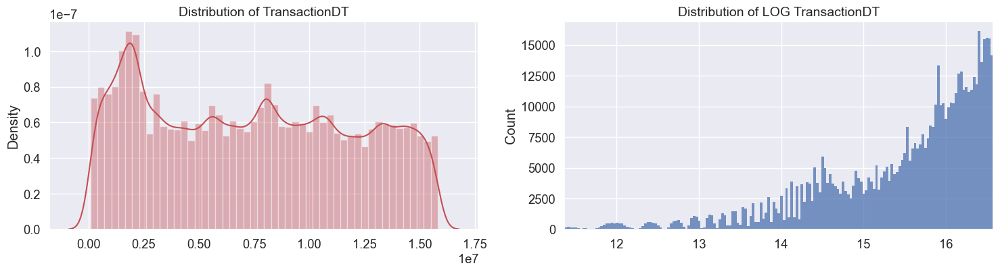

In [178]:

fig, ax = plt.subplots(1, 2, figsize=(18,4))

time_val = train_transaction['TransactionDT'].values

sns.distplot(time_val, ax=ax[0], color='r')
ax[0].set_title('Distribution of TransactionDT', fontsize=14)
ax[1].set_xlim([min(time_val), max(time_val)])

sns.histplot(np.log(time_val), ax=ax[1], color='b')
ax[1].set_title('Distribution of LOG TransactionDT', fontsize=14)
ax[1].set_xlim([min(np.log(time_val)), max(np.log(time_val))])

plt.show()

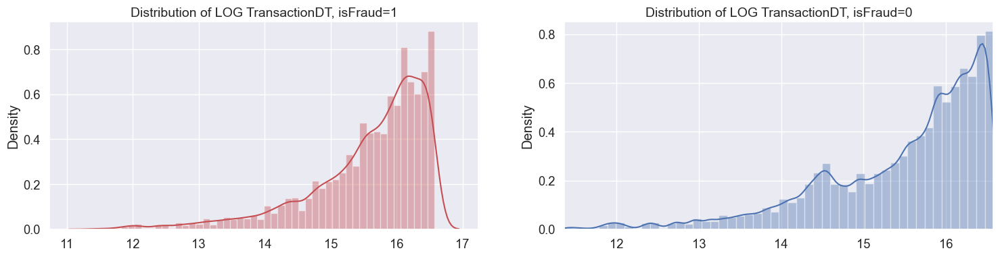

In [179]:
fig, ax = plt.subplots(1, 2, figsize=(18,4))

time_val = train_transaction.loc[train_transaction['isFraud'] == 1]['TransactionDT'].values

sns.distplot(np.log(time_val), ax=ax[0], color='r')
ax[0].set_title('Distribution of LOG TransactionDT, isFraud=1', fontsize=14)
ax[1].set_xlim([min(np.log(time_val)), max(np.log(time_val))])

time_val = train_transaction.loc[train_transaction['isFraud'] == 0]['TransactionDT'].values

sns.distplot(np.log(time_val), ax=ax[1], color='b')
ax[1].set_title('Distribution of LOG TransactionDT, isFraud=0', fontsize=14)
ax[1].set_xlim([min(np.log(time_val)), max(np.log(time_val))])


plt.show()

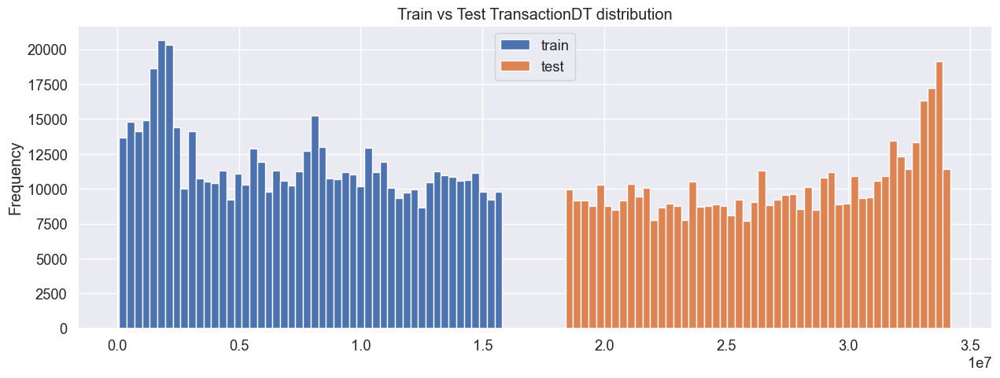

In [180]:
train_transaction['TransactionDT'].plot(kind='hist',
                                        figsize=(15, 5),
                                        label='train',
                                        bins=50,
                                        title='Train vs Test TransactionDT distribution')
test_transaction['TransactionDT'].plot(kind='hist',
                                       label='test',
                                       bins=50)
plt.legend()
plt.show()

##### isFraud vs time

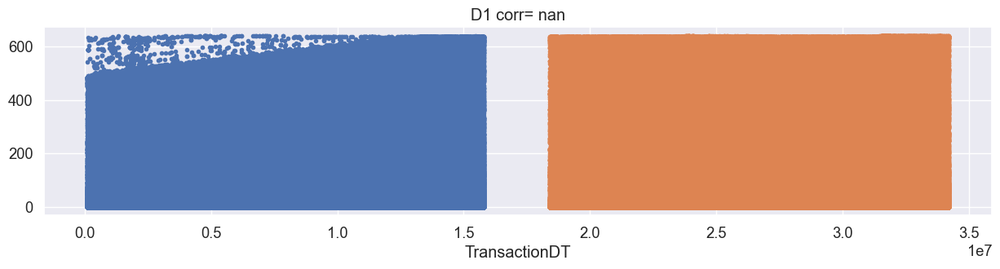

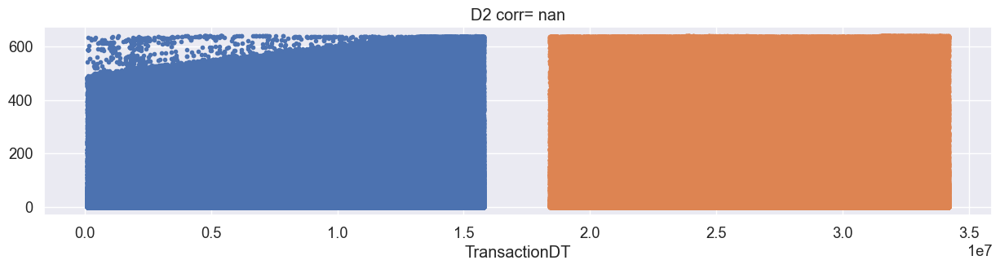

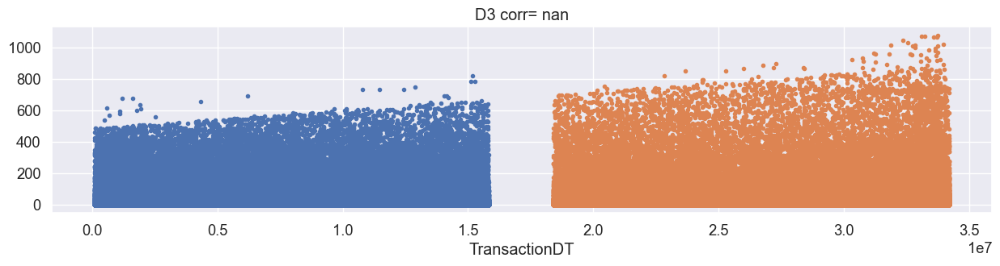

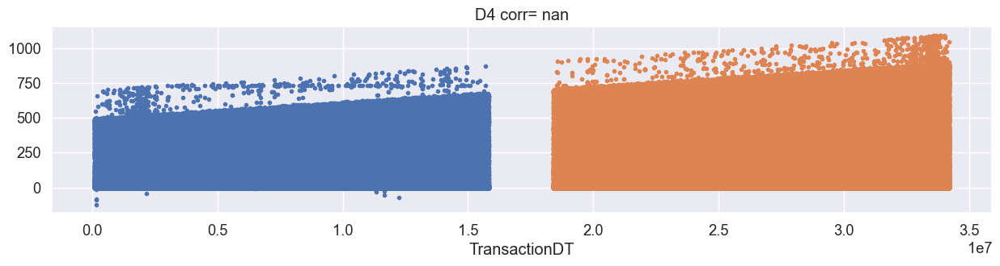

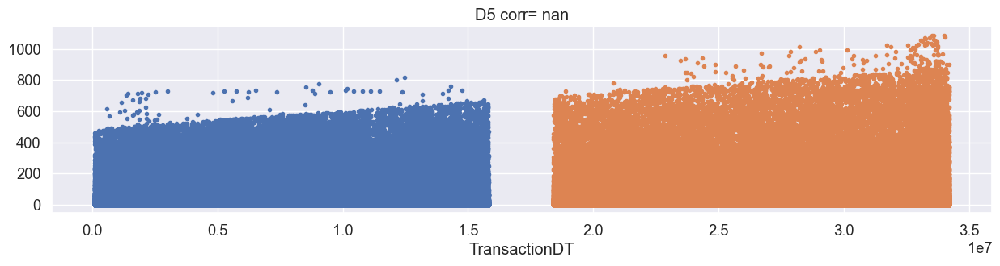

...

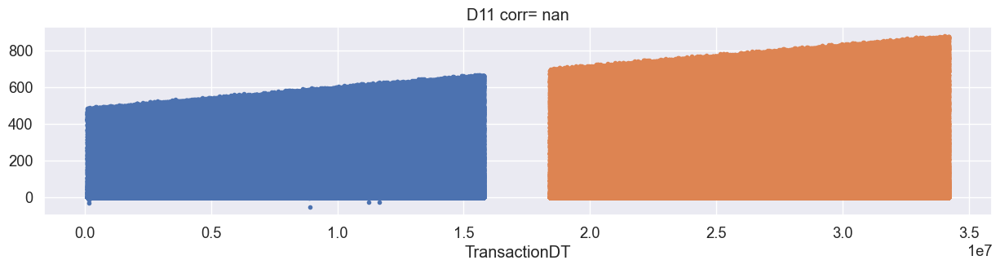

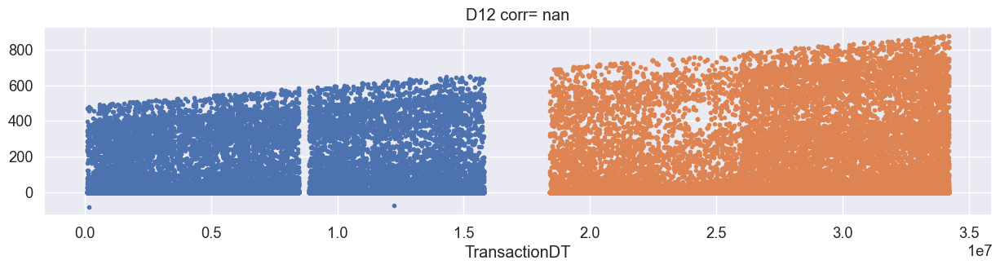

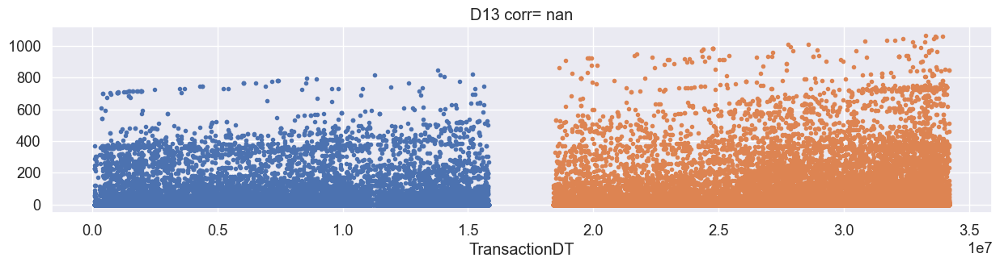

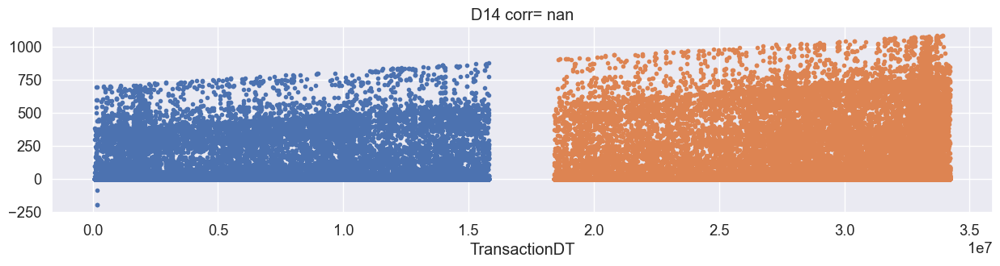

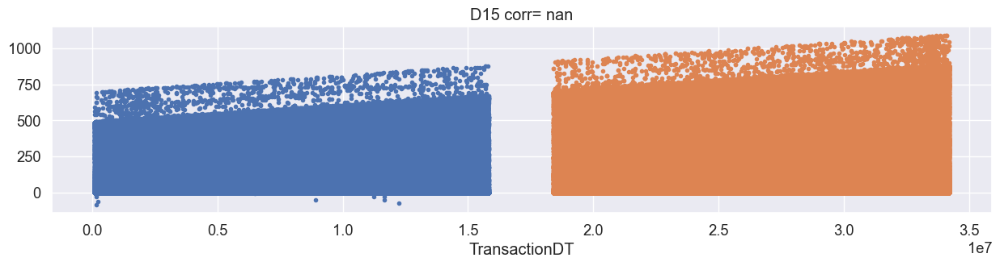

In [181]:

d_features = list(train_transaction.columns[30:45])

for i in d_features:
    cor = np.corrcoef(train_transaction['TransactionDT'], train_transaction[i])[0,1]
    train_transaction.set_index('TransactionDT')[i].plot(style='.', title=i+" corr= "+str(round(cor,3)), figsize=(15, 3))
    test_transaction.set_index('TransactionDT')[i].plot(style='.', title=i+" corr= "+str(round(cor,3)), figsize=(15, 3))
    plt.show()

In [182]:
missing_values_count = train_transaction[d_features].isnull().sum()
missing_values_count

D1       1269
D2     280797
D3     262878
D4     168922
D5     309841
D6     517353
D7     551623
D8     515614
D9     515614
D10     76022
D11    279287
D12    525823
D13    528588
D14    528353
D15     89113
dtype: int64

In [183]:
total_cells = np.prod(train_transaction[d_features].shape)
total_missing = missing_values_count.sum()
# percent of data that is missing
(total_missing/total_cells) * 100

np.float64(58.15126268612908)

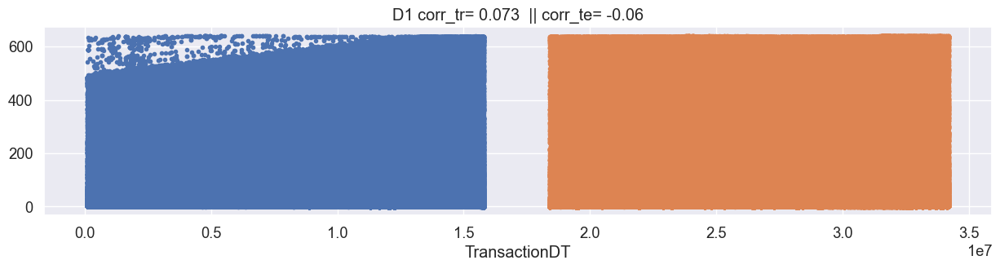

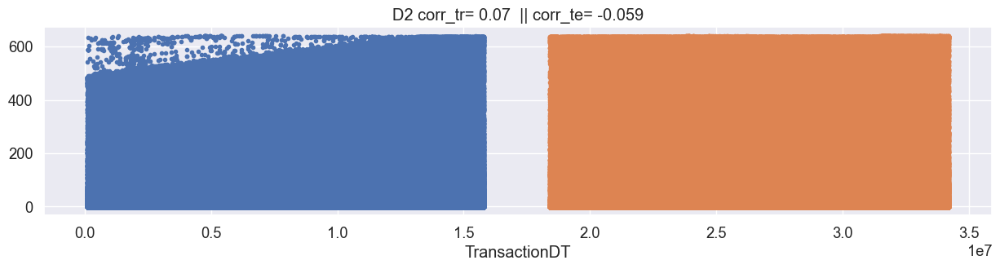

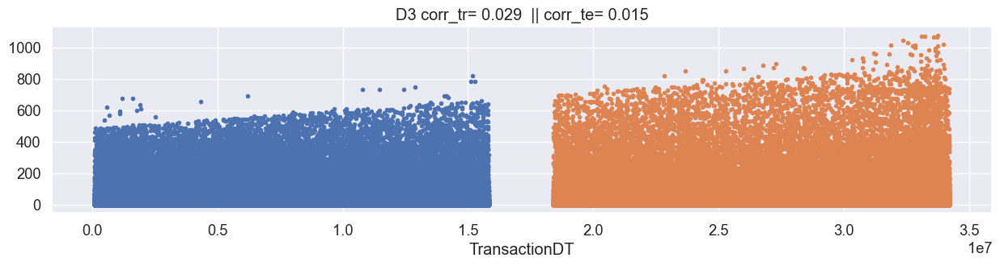

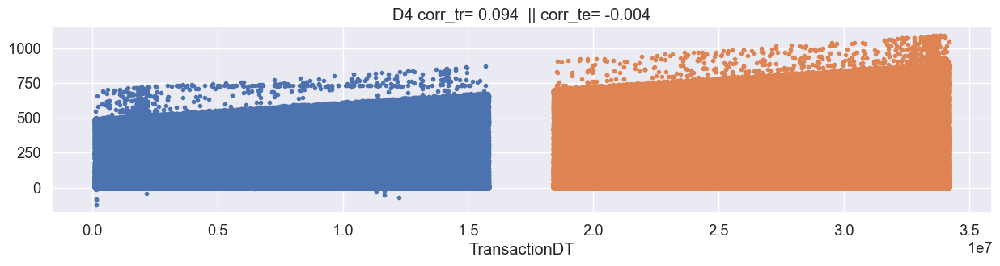

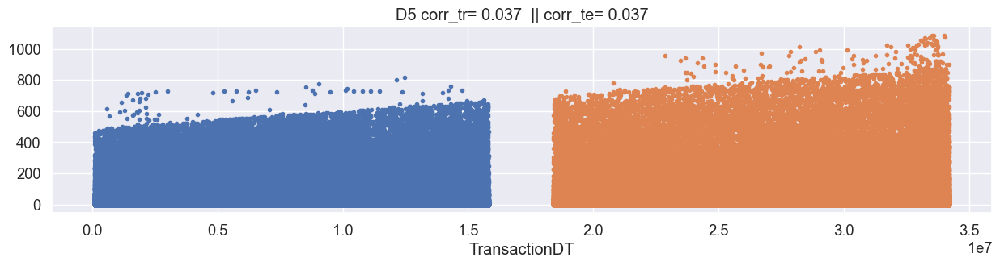

...

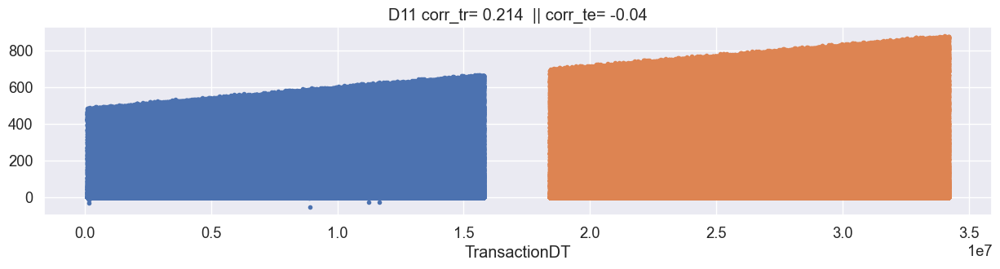

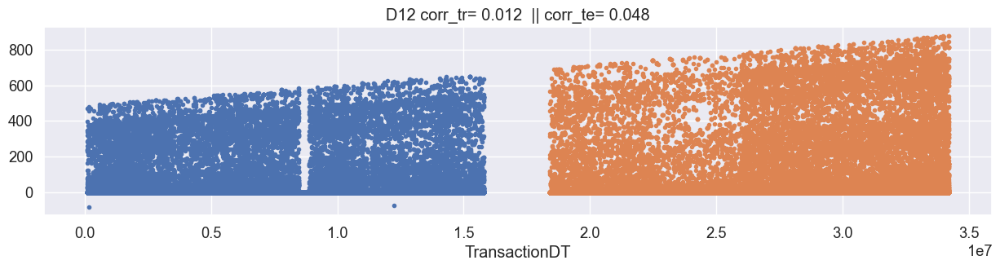

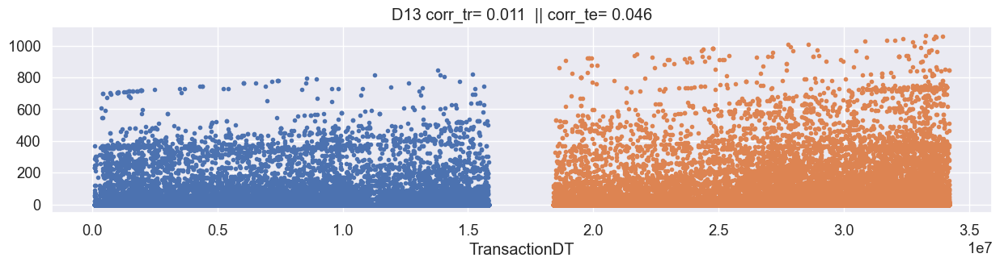

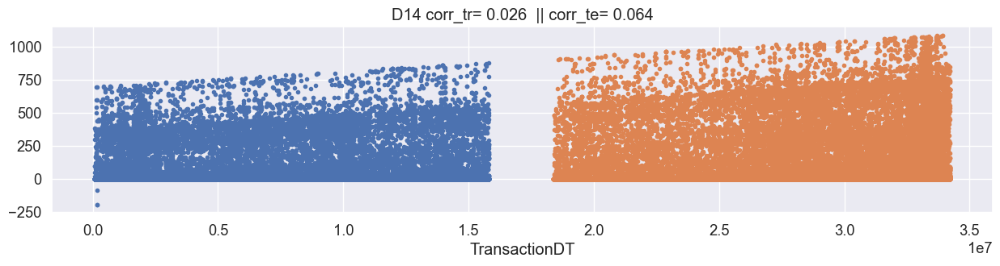

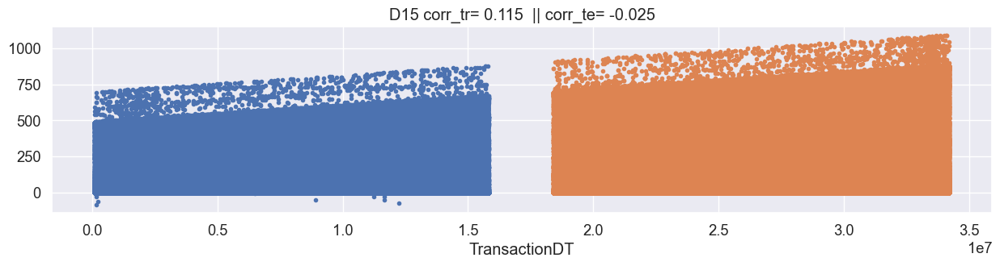

In [184]:
for i in d_features:
    cor_tr = np.corrcoef(train_transaction['TransactionDT'], train_transaction[i].fillna(-1))[0,1]
    cor_te = np.corrcoef(test_transaction['TransactionDT'], test_transaction[i].fillna(-1))[0,1]
    train_transaction.set_index('TransactionDT')[i].fillna(-1).plot(style='.', title=i+" corr_tr= "+str(round(cor_tr,3))+" || corr_te= "+str(round(cor_te,3)), figsize=(15, 3))
    test_transaction.set_index('TransactionDT')[i].fillna(-1).plot(style='.', title=i+" corr_tr= "+str(round(cor_tr,3))+"  || corr_te= "+str(round(cor_te,3)), figsize=(15, 3))
    plt.show()

In [185]:
del d_features, cor
gc.collect()

m_features = list(train_transaction.columns[45:54])
train_transaction[m_features].head()

,M1,M2,M3,M4,M5,M6,M7,M8,M9
TransactionID,,,,,,,,,
2987000,T,T,T,M2,F,T,NaN,NaN,NaN
2987001,NaN,NaN,NaN,M0,T,T,NaN,NaN,NaN
2987002,T,T,T,M0,F,F,F,F,F
2987003,NaN,NaN,NaN,M0,T,F,NaN,NaN,NaN
2987004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [186]:
del m_features
gc.collect()

19321

### V150

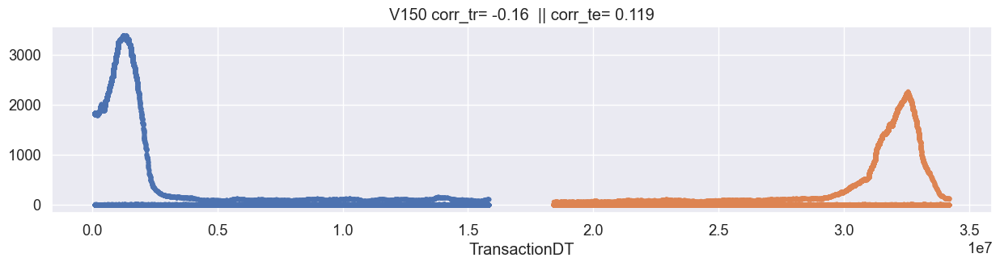

In [187]:
i = "V150"
cor_tr = np.corrcoef(train_transaction['TransactionDT'], train_transaction[i].fillna(-1))[0,1]
cor_te = np.corrcoef(test_transaction['TransactionDT'], test_transaction[i].fillna(-1))[0,1]
train_transaction.set_index('TransactionDT')[i].fillna(-1).plot(style='.', title=i+" corr_tr= "+str(round(cor_tr,3))+" || corr_te= "+str(round(cor_te,3)), figsize=(15, 3))
test_transaction.set_index('TransactionDT')[i].fillna(-1).plot(style='.', title=i+" corr_tr= "+str(round(cor_tr,3))+"  || corr_te= "+str(round(cor_te,3)), figsize=(15, 3))
plt.show()

### Groups


In [188]:
train_transaction.loc[:,train_transaction.columns[train_transaction.columns.str.startswith('V')]].isnull().sum().head(20)


V1     279287
V2     279287
V3     279287
V4     279287
V5     279287
V6     279287
V7     279287
V8     279287
V9     279287
V10    279287
V11    279287
V12     76073
V13     76073
V14     76073
V15     76073
V16     76073
V17     76073
V18     76073
V19     76073
V20     76073
dtype: int64

### TransactionAmt

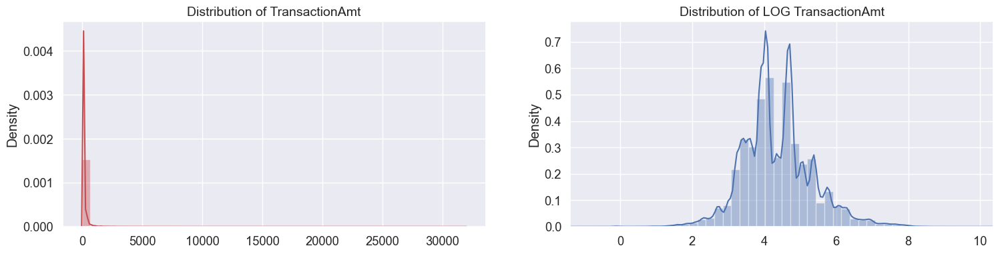

In [189]:
fig, ax = plt.subplots(1, 2, figsize=(18,4))

time_val = train_transaction['TransactionAmt'].values

sns.distplot(time_val, ax=ax[0], color='r')
ax[0].set_title('Distribution of TransactionAmt', fontsize=14)
ax[1].set_xlim([min(time_val), max(time_val)])

sns.distplot(np.log(time_val), ax=ax[1], color='b')
ax[1].set_title('Distribution of LOG TransactionAmt', fontsize=14)
ax[1].set_xlim([min(np.log(time_val)), max(np.log(time_val))])

plt.show()

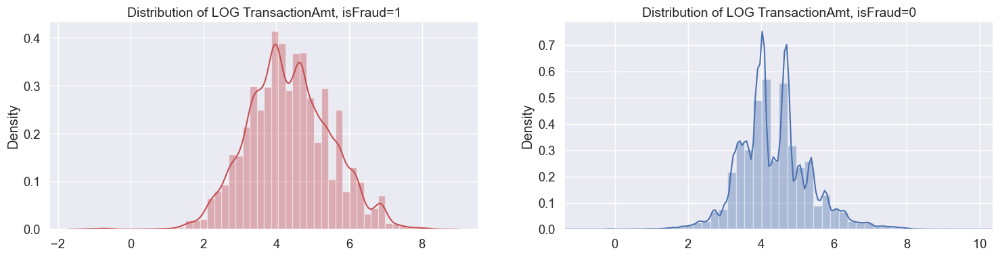

In [190]:

fig, ax = plt.subplots(1, 2, figsize=(18,4))

time_val = train_transaction.loc[train_transaction['isFraud'] == 1]['TransactionAmt'].values

sns.distplot(np.log(time_val), ax=ax[0], color='r')
ax[0].set_title('Distribution of LOG TransactionAmt, isFraud=1', fontsize=14)
ax[1].set_xlim([min(np.log(time_val)), max(np.log(time_val))])

time_val = train_transaction.loc[train_transaction['isFraud'] == 0]['TransactionAmt'].values

sns.distplot(np.log(time_val), ax=ax[1], color='b')
ax[1].set_title('Distribution of LOG TransactionAmt, isFraud=0', fontsize=14)
ax[1].set_xlim([min(np.log(time_val)), max(np.log(time_val))])


plt.show()

In [191]:
del time_val

In [192]:
tmp = train_transaction[['TransactionAmt', 'isFraud']][0:100000]
plot_distribution(tmp[(tmp['TransactionAmt'] <= 800)], 'TransactionAmt', 'Transaction Amount Distribution', bins=10.0,)
del tmp

## Unique Values
####  D Features

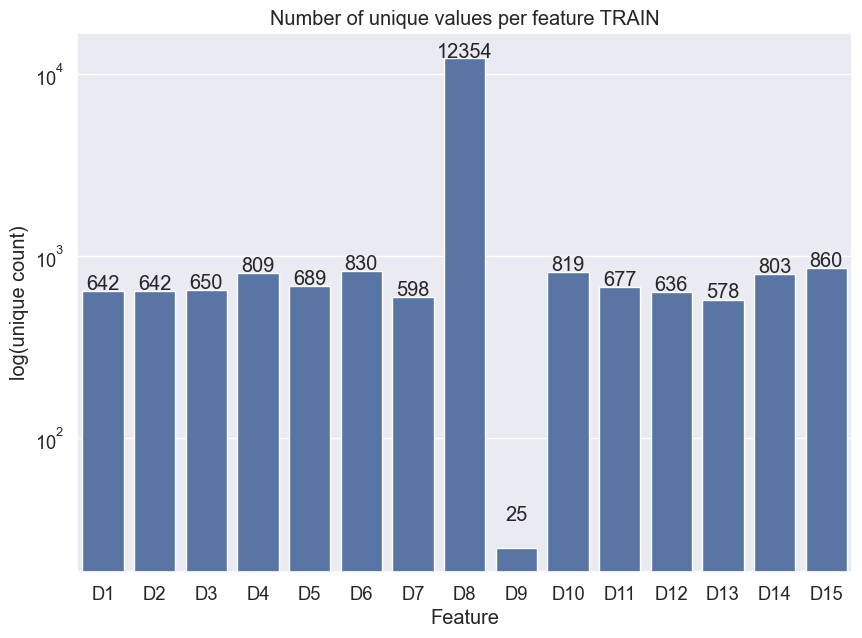

In [193]:
plt.figure(figsize=(10, 7))
d_features = list(train_transaction.columns[30:45])
uniques = [len(train_transaction[col].unique()) for col in d_features]
sns.set(font_scale=1.2)
ax = sns.barplot(x=d_features,y= uniques, log=True)
ax.set(xlabel='Feature', ylabel='log(unique count)', title='Number of unique values per feature TRAIN')
for p, uniq in zip(ax.patches, uniques):
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 10,
            uniq,
            ha="center")

### Categorical Features

In [194]:
train_transaction.head(3)

,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
TransactionID,,,,,,,,,,,,,,,,,,,,,
2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


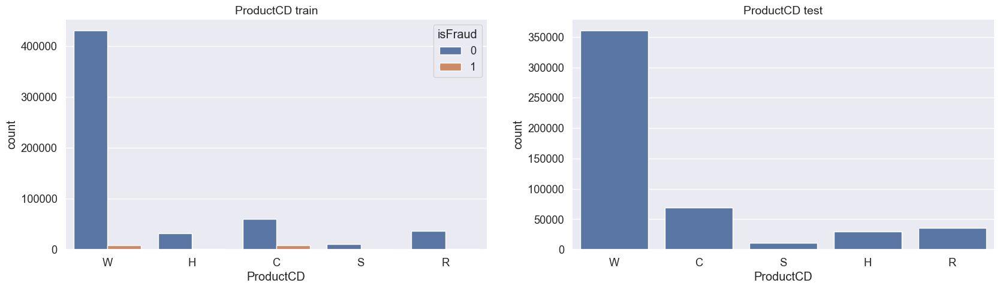

In [195]:
fig, ax = plt.subplots(1, 2, figsize=(20,5))

sns.countplot(x="ProductCD", ax=ax[0], hue = "isFraud", data=train_transaction)
ax[0].set_title('ProductCD train', fontsize=14)
sns.countplot(x="ProductCD", ax=ax[1], data=test_transaction)
ax[1].set_title('ProductCD test', fontsize=14)
plt.show()

#### Device Type & Device Info

### Categorical Features


- ProductCD
- emaildoamin
- card1- card6
- addr1, addr2


In [196]:
train_transaction.head()
train_identity.head()

,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
TransactionID,,,,,,,,,,,,,,,,,,,,,
2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,NaN,...,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device
2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,Windows
2987011,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,NaN,NaN,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,NaN
2987016,0.0,7460.0,0.0,0.0,1.0,0.0,NaN,NaN,0.0,0.0,...,chrome 62.0,24.0,1280x800,match_status:2,T,F,T,T,desktop,MacOS


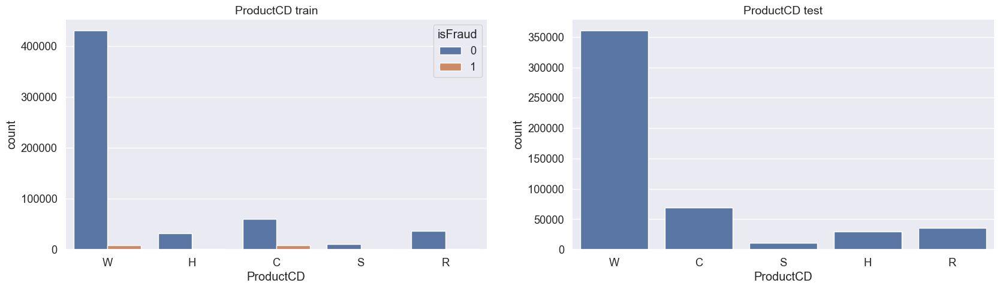

In [197]:
fig, ax = plt.subplots(1, 2, figsize=(20,5))

sns.countplot(x = "ProductCD",ax = ax[0], hue = "isFraud", data = train_transaction)
ax[0].set_title('ProductCD train', fontsize=14)
sns.countplot(x = "ProductCD",ax = ax[1], data = test_transaction)
ax[1].set_title('ProductCD test', fontsize=14)
plt.show()

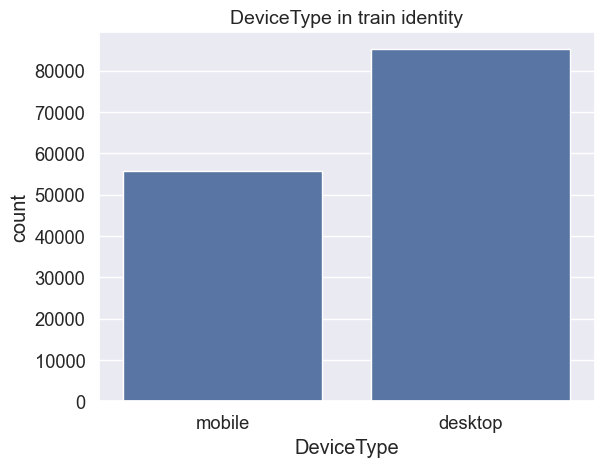

In [198]:
ax = sns.countplot(x="DeviceType", data=train_identity)
ax.set_title('DeviceType in train identity', fontsize=14)
plt.show()

In [199]:
print("Unique Devices =", train_identity['DeviceInfo'].nunique())
train_identity['DeviceInfo'].value_counts().head()

Unique Devices = 1786


DeviceInfo
Windows        47722
iOS Device     19782
MacOS          12573
Trident/7.0     7440
rv:11.0         1901
Name: count, dtype: int64

In [200]:
cards = ['card1', 'card2', 'card3', 'card4', 'card5', 'card6']
for i in cards:
    print(f'Feature {i}: {train_transaction[i].nunique()} unique values')

Feature card1: 13553 unique values
Feature card2: 500 unique values
Feature card3: 114 unique values
Feature card4: 4 unique values
Feature card5: 119 unique values
Feature card6: 4 unique values


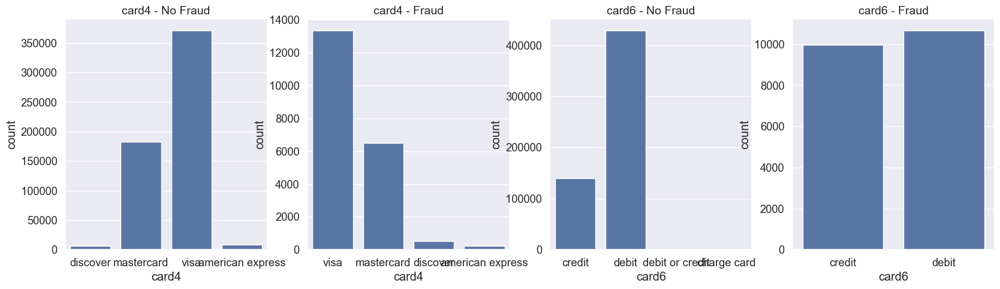

In [201]:
fig,ax  = plt.subplots(1,4, figsize=(20,5))
sns.countplot(x='card4', ax = ax[0], data=train_transaction.loc[train_transaction['isFraud']==0])
ax[0].set_title('card4 - No Fraud', fontsize=14)
sns.countplot(x='card4', ax = ax[1], data=train_transaction.loc[train_transaction['isFraud']==1])
ax[1].set_title('card4 - Fraud', fontsize=14)

sns.countplot(x='card6', ax = ax[2], data=train_transaction.loc[train_transaction['isFraud']==0])
ax[2].set_title('card6 - No Fraud', fontsize=14)
sns.countplot(x='card6', ax = ax[3], data=train_transaction.loc[train_transaction['isFraud']==1])
ax[3].set_title('card6 - Fraud', fontsize=14)
plt.show()


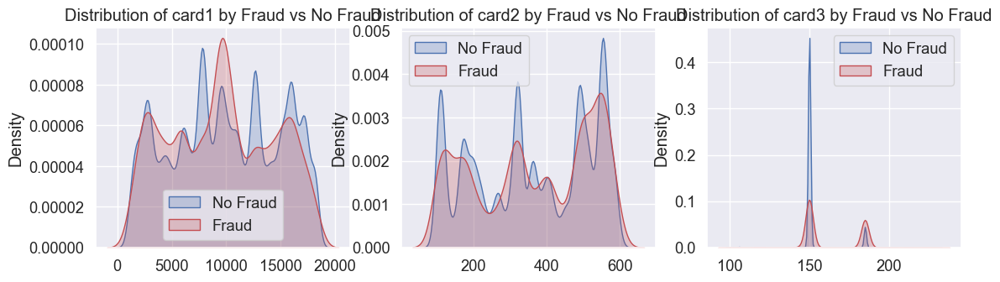

In [202]:
card = train_transaction.iloc[:, 4:7].columns
plt.figure(figsize=(18,8*4))
gs = gridspec.GridSpec(8,4)
for i, cn in enumerate(card):
    ax = plt.subplot(gs[i])
    sns.kdeplot(train_transaction.loc[train_transaction['isFraud']==0, cn], color='b', label='No Fraud', fill=True, ax=ax)
    sns.kdeplot(train_transaction.loc[train_transaction['isFraud']==1, cn], color='r', label='Fraud', fill=True, ax=ax)
    ax.set_xlabel('')
    ax.set_title('Distribution of {} by Fraud vs No Fraud'.format(cn))
    ax.legend()

In [203]:
"emaildoamin" in train_transaction.columns, " emaildomain" in test_transaction.columns

(False, False)

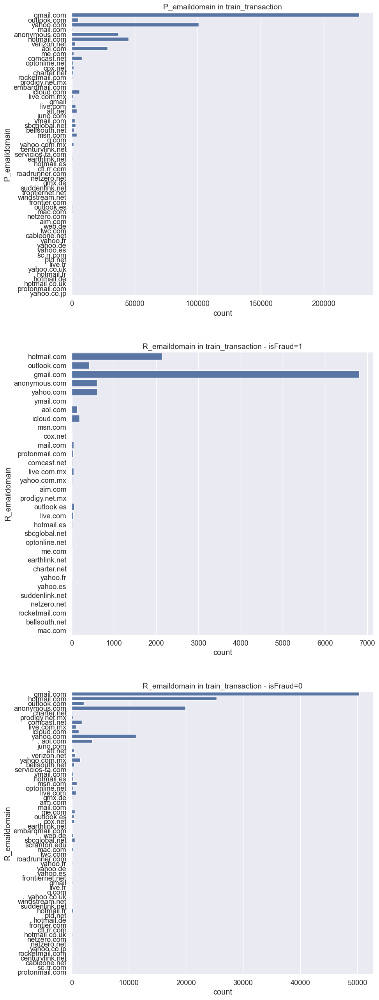

In [204]:
fig,ax = plt.subplots(3,1, figsize=(10,32))
sns.countplot(y='P_emaildomain',ax= ax[0], data=train_transaction)
ax[0].set_title('P_emaildomain in train_transaction', fontsize=14)
sns.countplot(y='R_emaildomain', data=train_transaction.loc[train_transaction['isFraud']==1], ax=ax[1])
ax[1].set_title('R_emaildomain in train_transaction - isFraud=1', fontsize=14)
sns.countplot(y='R_emaildomain', data=train_transaction.loc[train_transaction['isFraud']==0], ax=ax[2])
ax[2].set_title('R_emaildomain in train_transaction - isFraud=0', fontsize=14)
plt.show()


### Memory reduction
##### Merge  transaction &  identity + Label Encoder


In [205]:
train_transaction.columns, train_identity.columns

(Index(['isFraud', 'TransactionDT', 'TransactionAmt', 'ProductCD', 'card1',
        'card2', 'card3', 'card4', 'card5', 'card6',
        ...
        'V330', 'V331', 'V332', 'V333', 'V334', 'V335', 'V336', 'V337', 'V338',
        'V339'],
       dtype='object', length=393),
 Index(['id_01', 'id_02', 'id_03', 'id_04', 'id_05', 'id_06', 'id_07', 'id_08',
        'id_09', 'id_10', 'id_11', 'id_12', 'id_13', 'id_14', 'id_15', 'id_16',
        'id_17', 'id_18', 'id_19', 'id_20', 'id_21', 'id_22', 'id_23', 'id_24',
        'id_25', 'id_26', 'id_27', 'id_28', 'id_29', 'id_30', 'id_31', 'id_32',
        'id_33', 'id_34', 'id_35', 'id_36', 'id_37', 'id_38', 'DeviceType',
        'DeviceInfo'],
       dtype='object'))

In [206]:
%%time
train = train_transaction.merge(train_identity, how='left', left_index=True, right_index=True)
y_train = train['isFraud'].astype('uint8').copy()
print("Train",train.shape)
del train_transaction, train_identity



Train (590540, 433)
CPU times: user 261 ms, sys: 200 ms, total: 461 ms
Wall time: 518 ms


In [207]:
test = test_transaction.merge(test_identity, how='left', left_index=True, right_index=True)
print("Test: ",test.shape)
del test_transaction, test_identity
print ("Merged!")

Test:  (506691, 432)
Merged!


In [208]:
X_train = train.drop('isFraud', axis=1)
X_test = test.copy()

del train, test
gc.collect()


for f in X_train.columns:
    if X_train[f].dtype=='object' or X_test[f].dtype=='object':
        print(f)
        lbl = preprocessing.LabelEncoder()
        lbl.fit(list(X_train[f].astype(str).values) + list(X_test[f].astype(str).values))
        X_train[f] = lbl.transform(list(X_train[f].astype(str).values))
        X_test[f] = lbl.transform(list(X_test[f].astype(str).values))

ProductCD
card4
card6
P_emaildomain
R_emaildomain
M1
M2
M3
M4
M5
M6
M7
M8
M9


KeyError: 'id_01'

In [ ]:
def reduce_mem_usage1(props):
    start_mem_usg = props.memory_usage().sum() / 1024**2 
    print("Memory usage of properties dataframe is :",start_mem_usg," MB")
    NAlist = [] # Keeps track of columns that have missing values filled in. 
    for col in props.columns:
        if props[col].dtype != object:  # Exclude strings
            
            # Print current column type
            print("******************************")
            print("Column: ",col)
            print("dtype before: ",props[col].dtype)
            
            # make variables for Int, max and min
            IsInt = False
            mx = props[col].max()
            mn = props[col].min()
            
            # Integer does not support NA, therefore, NA needs to be filled
            if not np.isfinite(props[col]).all(): 
                NAlist.append(col)
                props[col].fillna(mn-1,inplace=True)  
                   
            # test if column can be converted to an integer
            asint = props[col].fillna(0).astype(np.int64)
            result = (props[col] - asint)
            result = result.sum()
            if result > -0.01 and result < 0.01:
                IsInt = True

            
            # Make Integer/unsigned Integer datatypes
            if IsInt:
                if mn >= 0:
                    if mx < 255:
                        props[col] = props[col].astype(np.uint8)
                    elif mx < 65535:
                        props[col] = props[col].astype(np.uint16)
                    elif mx < 4294967295:
                        props[col] = props[col].astype(np.uint32)
                    else:
                        props[col] = props[col].astype(np.uint64)
                else:
                    if mn > np.iinfo(np.int8).min and mx < np.iinfo(np.int8).max:
                        props[col] = props[col].astype(np.int8)
                    elif mn > np.iinfo(np.int16).min and mx < np.iinfo(np.int16).max:
                        props[col] = props[col].astype(np.int16)
                    elif mn > np.iinfo(np.int32).min and mx < np.iinfo(np.int32).max:
                        props[col] = props[col].astype(np.int32)
                    elif mn > np.iinfo(np.int64).min and mx < np.iinfo(np.int64).max:
                        props[col] = props[col].astype(np.int64)    
            
            # Make float datatypes 32 bit
            else:
                props[col] = props[col].astype(np.float32)
            
            # Print new column type
            print("dtype after: ",props[col].dtype)
            print("******************************")
    
    # Print final result
    print("___MEMORY USAGE AFTER COMPLETION:___")
    mem_usg = props.memory_usage().sum() / 1024**2 
    print("Memory usage is: ",mem_usg," MB")
    print("This is ",100*mem_usg/start_mem_usg,"% of the initial size")
    return props, NAlist

In [ ]:
X_train = reduce_mem_usage2(X_train)
X_test = reduce_mem_usage2(X_test)

In [ ]:
X_train.head(3), X_test.head(3)